In [1]:
!pip install keras

In [2]:
!pip install keras-preprocessing

In [3]:
from keras.models import load_model
from keras_preprocessing.image import img_to_array
from keras_preprocessing.image import load_img
import tensorflow
from tensorflow import keras
from flask import Flask, render_template, request
from keras.applications.inception_v3 import preprocess_input
import numpy as np
import pandas as pd
import warnings
import cv2
warnings.filterwarnings("ignore")


In [4]:
app = Flask(__name__)

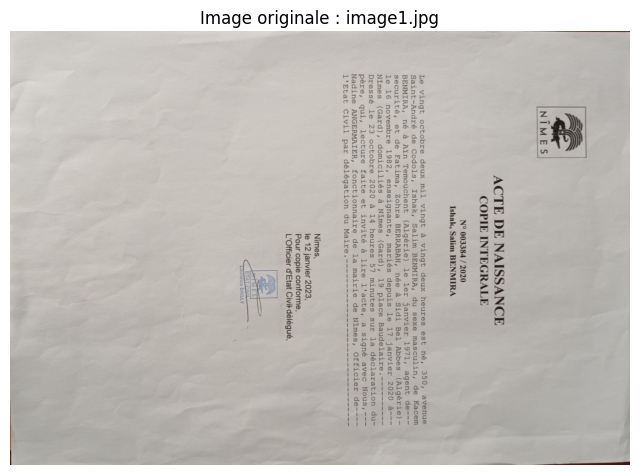

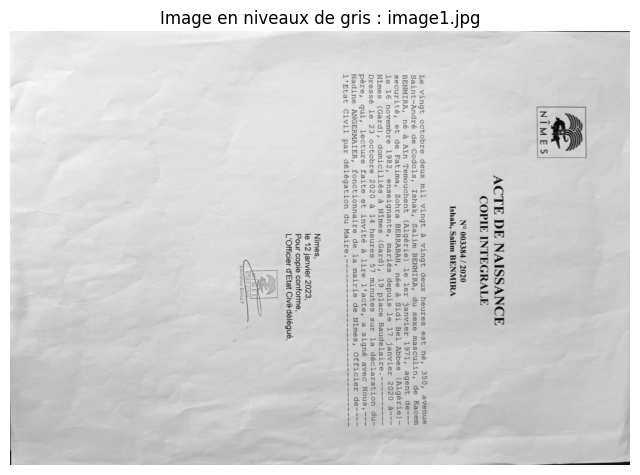

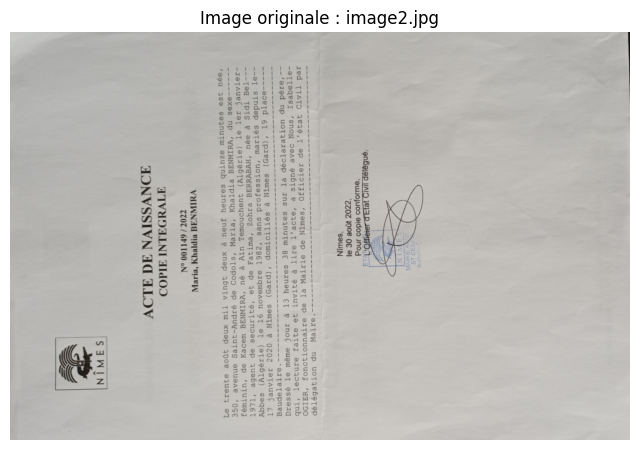

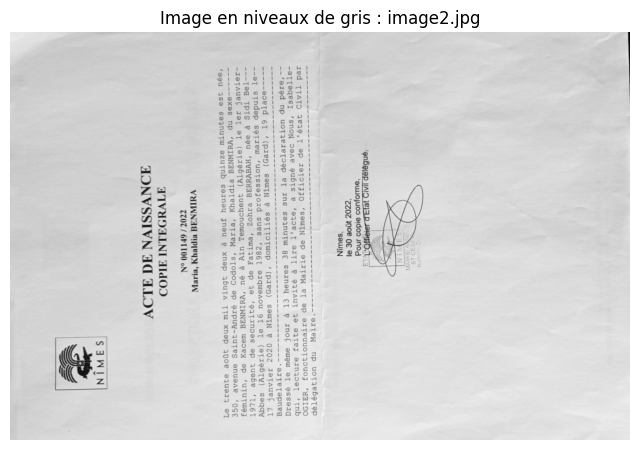

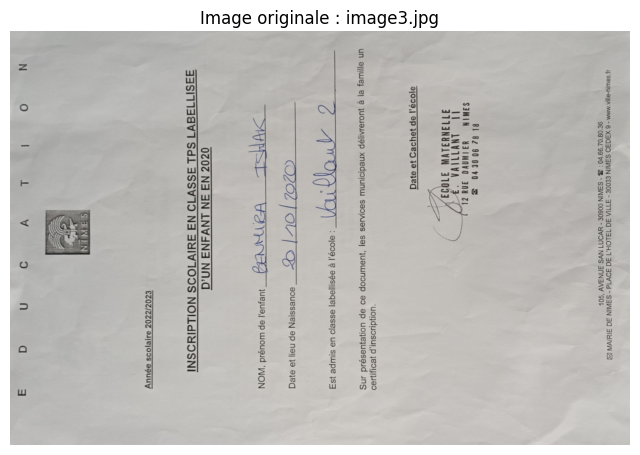

...

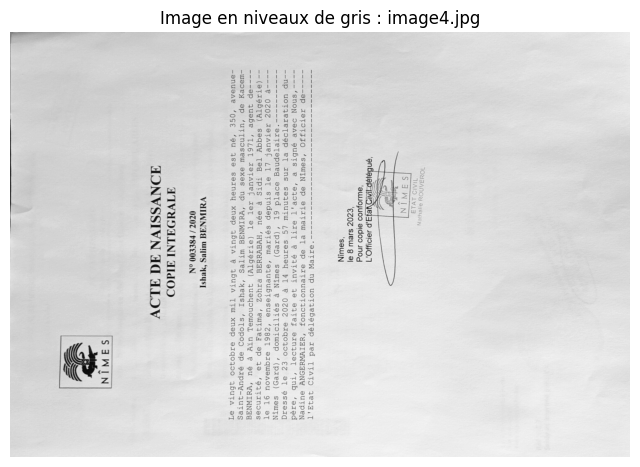

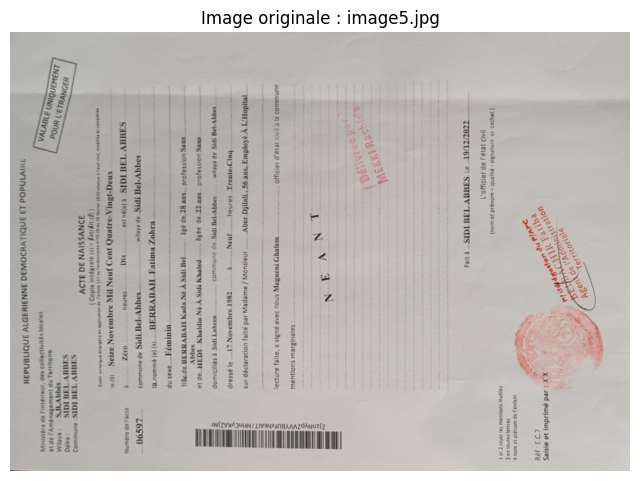

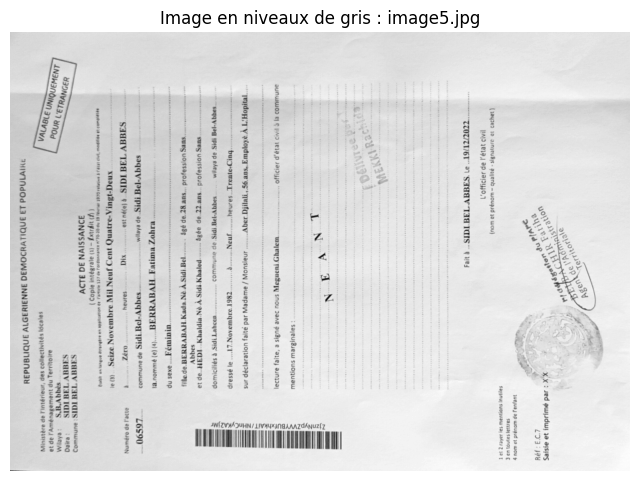

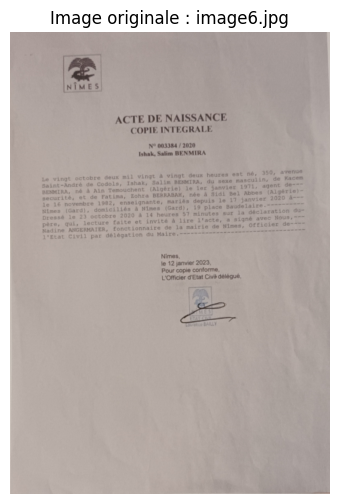

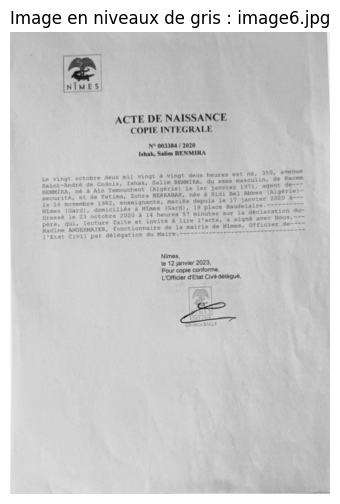

In [5]:
import os
import cv2
from matplotlib import pyplot as plt

# Chemin vers le dossier contenant les documents administratifs
dossier_documents = r"C:\Users\berra\Desktop\Stage\Data"

# Liste des fichiers dans le dossier
fichiers = os.listdir(dossier_documents)

# Boucle à travers les fichiers
for fichier in fichiers:
    # Charger l'image
    chemin_image = os.path.join(dossier_documents, fichier)
    image = cv2.imread(chemin_image)

    # Convertir l'image en niveaux de gris
    image_grise = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Afficher l'image originale
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Image originale : " + fichier)
    plt.axis('off')
    plt.show()

    # Afficher l'image en niveaux de gris
    plt.figure(figsize=(8, 6))
    plt.imshow(image_grise, cmap='gray')
    plt.title("Image en niveaux de gris : " + fichier)
    plt.axis('off')
    plt.show()

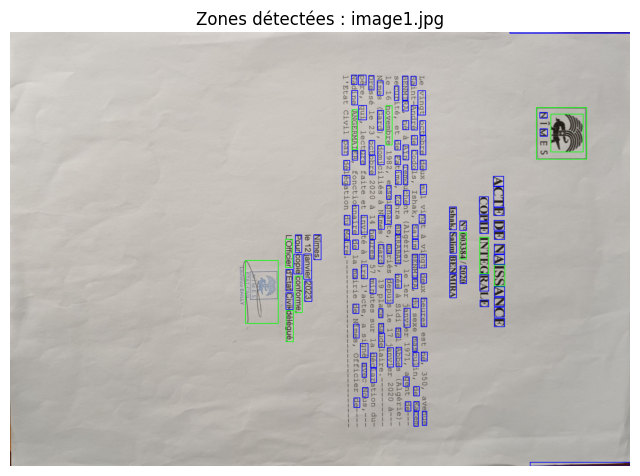

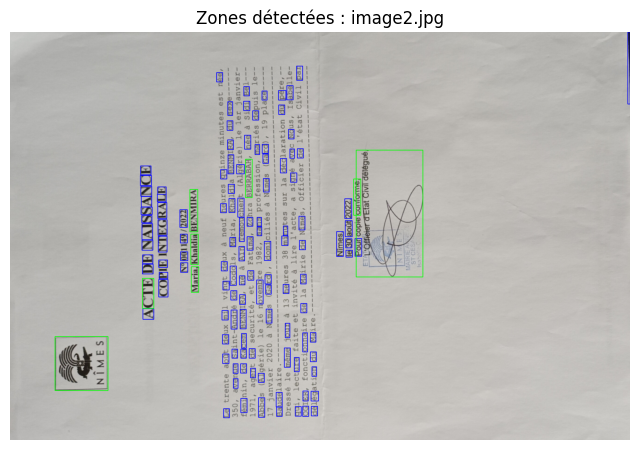

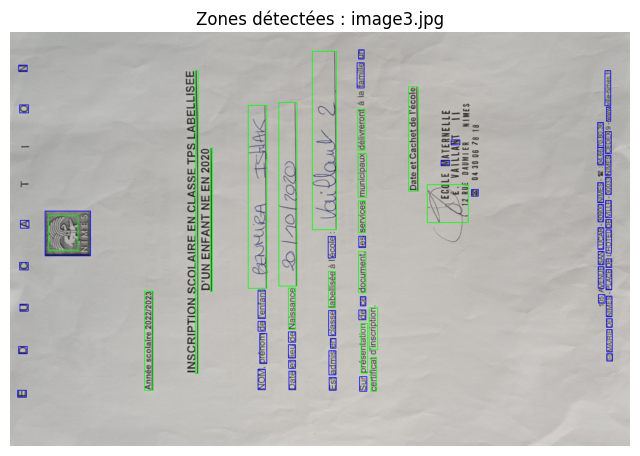

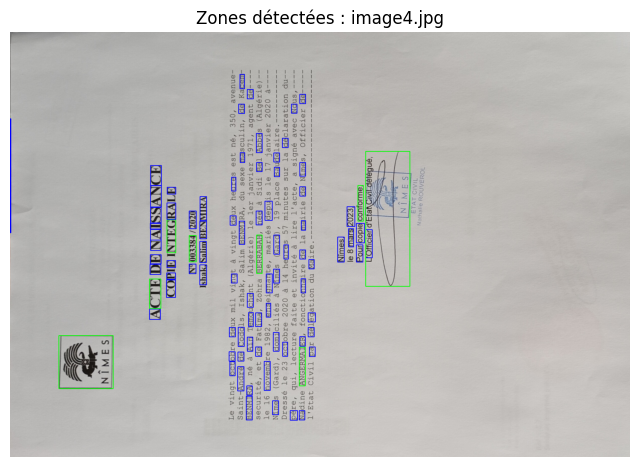

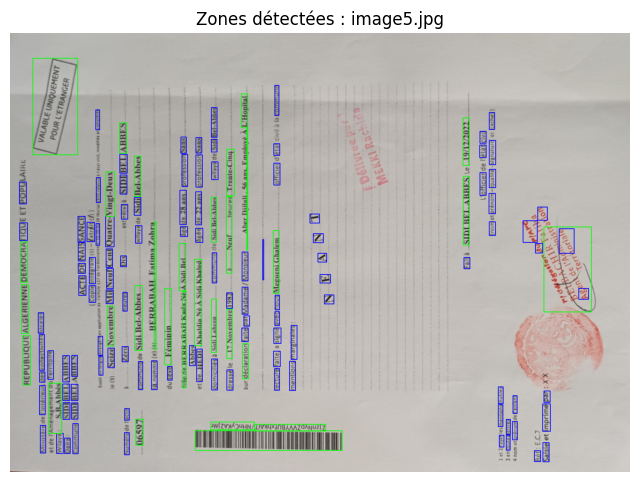

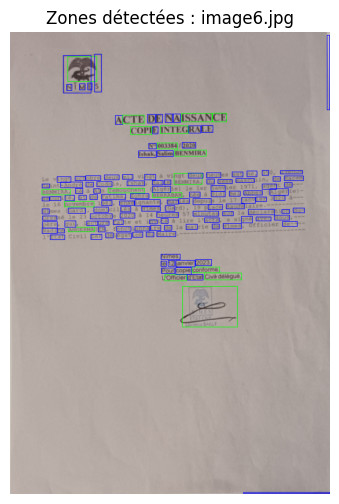

In [6]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Chemin vers le dossier contenant les documents administratifs
dossier_documents = r"C:\Users\berra\Desktop\Stage\Data"

# Liste des fichiers dans le dossier
fichiers = os.listdir(dossier_documents)

# Paramètres pour la détection des contours
seuil_bas = 20
seuil_haut = 150

# Paramètres pour l'analyse des régions
aire_minimale_contour = 500  # Aire minimale pour considérer un contour
aire_minimale_signature = 2000  # Aire minimale pour considérer une signature

# Boucle à travers les fichiers
for fichier in fichiers:
    # Charger l'image
    chemin_image = os.path.join(dossier_documents, fichier)
    image = cv2.imread(chemin_image)

    # Convertir l'image en niveaux de gris
    image_grise = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Appliquer un filtre de Sobel pour détecter les gradients
    gradient_x = cv2.Sobel(image_grise, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image_grise, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
    gradient_magnitude = np.uint8(255 * gradient_magnitude / np.max(gradient_magnitude))

    # Seuillage adaptatif pour binariser l'image des gradients
    _, image_binarisee = cv2.threshold(gradient_magnitude, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Appliquer une transformation morphologique pour supprimer le bruit
    element_structurant = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    image_morpho = cv2.morphologyEx(image_binarisee, cv2.MORPH_CLOSE, element_structurant)

    # Trouver les contours dans l'image
    contours, _ = cv2.findContours(image_morpho, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Analyser les contours pour détecter les cachets et les signatures
    for contour in contours:
        aire = cv2.contourArea(contour)
        if aire > aire_minimale_contour:
            # Approximer le contour pour obtenir une forme plus simple
            epsilon = 0.02 * cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, epsilon, True)
            x, y, w, h = cv2.boundingRect(approx)

            # Filtrer les contours en fonction de leur taille et de leur forme
            if aire > aire_minimale_signature:
                # Dessiner un rectangle autour de la signature détectée
                cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
            else:
                # Dessiner un rectangle autour du cachet détecté
                cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Afficher l'image avec les zones détectées
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Zones détectées : " + fichier)
    plt.axis('off')
    plt.show()

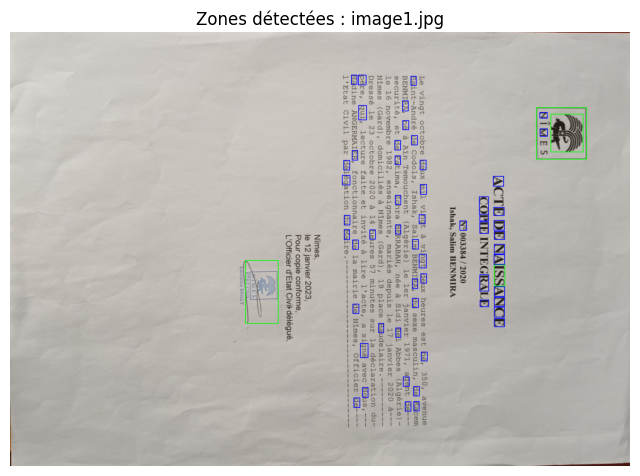

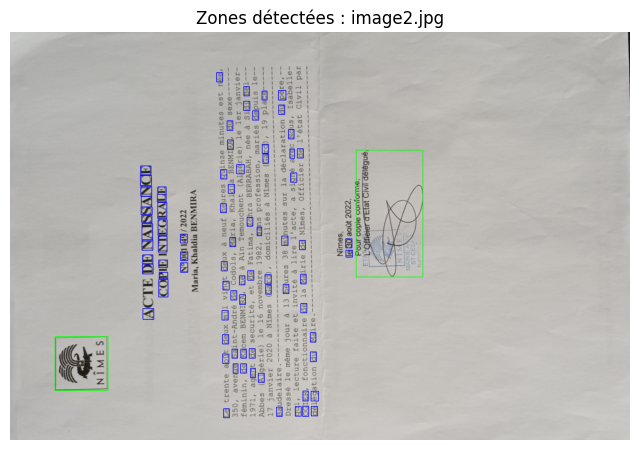

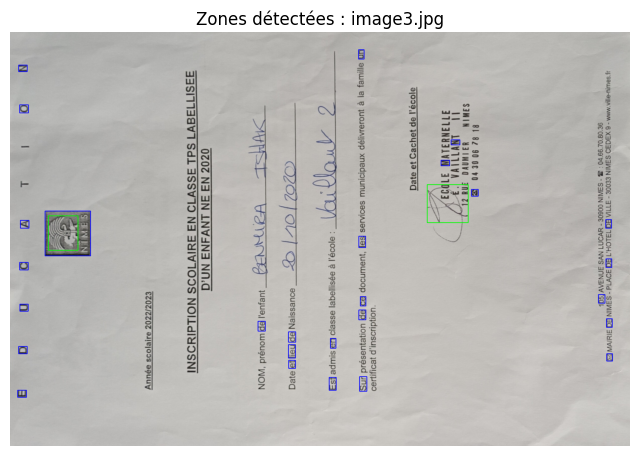

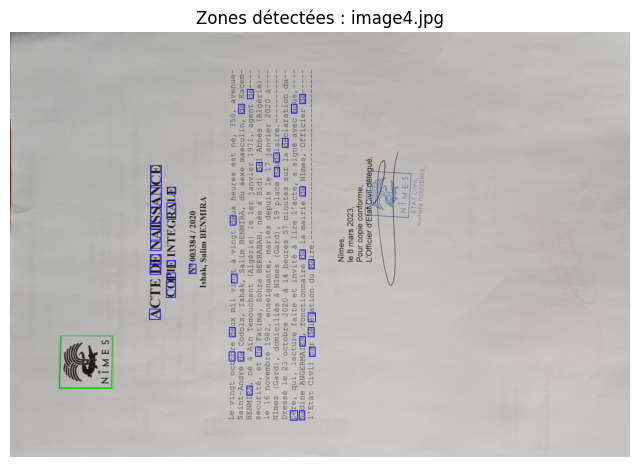

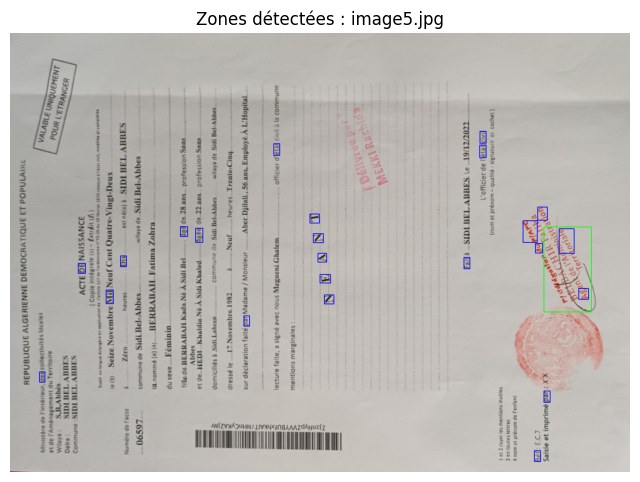

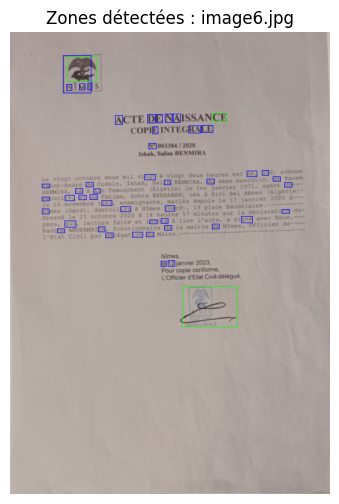

In [17]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Chemin vers le dossier contenant les documents administratifs
dossier_documents = r"C:\Users\berra\Desktop\Stage\Data"

# Liste des fichiers dans le dossier
fichiers = os.listdir(dossier_documents)

# Paramètres pour la détection des contours
seuil_bas = 20
seuil_haut = 150

# Paramètres pour l'analyse des régions
aire_minimale_contour = 500  # Aire minimale pour considérer un contour
aire_minimale_signature = 2000  # Aire minimale pour considérer une signature

# Aspect ratio pour filtrer les contours
aspect_ratio_min = 0.5
aspect_ratio_max = 2.0

# Boucle à travers les fichiers
for fichier in fichiers:
    # Charger l'image
    chemin_image = os.path.join(dossier_documents, fichier)
    image = cv2.imread(chemin_image)

    # Convertir l'image en niveaux de gris
    image_grise = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Appliquer un filtre de Sobel pour détecter les gradients
    gradient_x = cv2.Sobel(image_grise, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image_grise, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
    gradient_magnitude = np.uint8(255 * gradient_magnitude / np.max(gradient_magnitude))

    # Seuillage adaptatif pour binariser l'image des gradients
    _, image_binarisee = cv2.threshold(gradient_magnitude, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Appliquer une transformation morphologique pour supprimer le bruit
    element_structurant = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    image_morpho = cv2.morphologyEx(image_binarisee, cv2.MORPH_CLOSE, element_structurant)

    # Trouver les contours dans l'image
    contours, _ = cv2.findContours(image_morpho, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Analyser les contours pour détecter les cachets et les signatures
    for contour in contours:
        aire = cv2.contourArea(contour)
        if aire > aire_minimale_contour:
            # Approximer le contour pour obtenir une forme plus simple
            epsilon = 0.02 * cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, epsilon, True)
            x, y, w, h = cv2.boundingRect(approx)

            # Calculer l'aspect ratio du contour
            aspect_ratio = w / h

            # Filtrer les contours en fonction de leur taille, de leur forme et de leur aspect ratio
            if aire > aire_minimale_signature and aspect_ratio >= aspect_ratio_min and aspect_ratio <= aspect_ratio_max:
                # Dessiner un rectangle autour de la signature détectée
                cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
            elif aspect_ratio >= aspect_ratio_min and aspect_ratio <= aspect_ratio_max:
                # Dessiner un rectangle autour du cachet détecté
                cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Afficher l'image avec les zones détectées
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Zones détectées : " + fichier)
    plt.axis('off')
    plt.show()

In [7]:
!pip install scikit-image

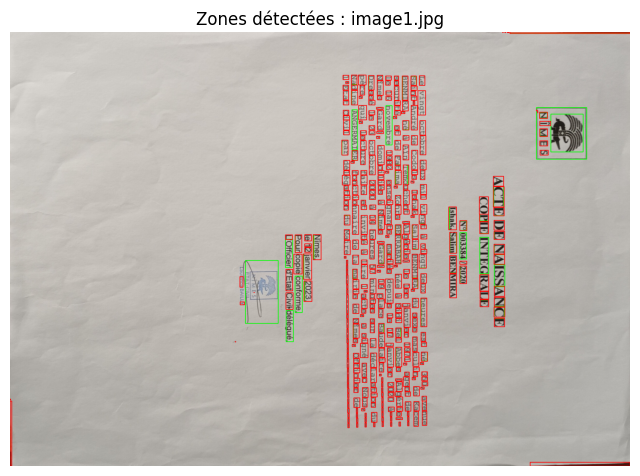

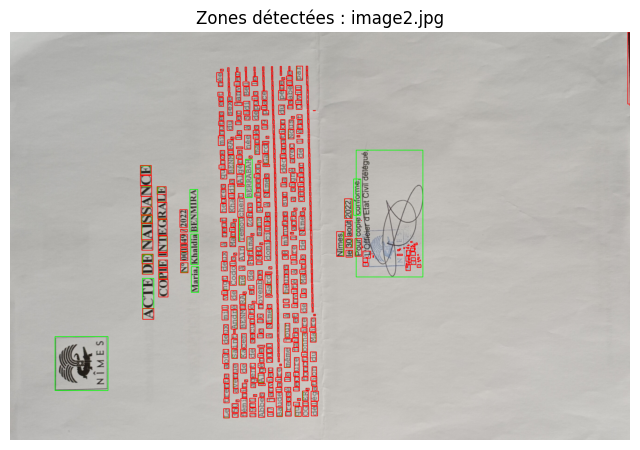

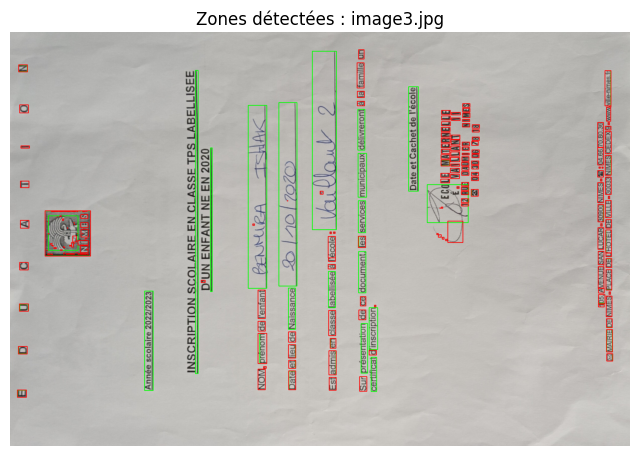

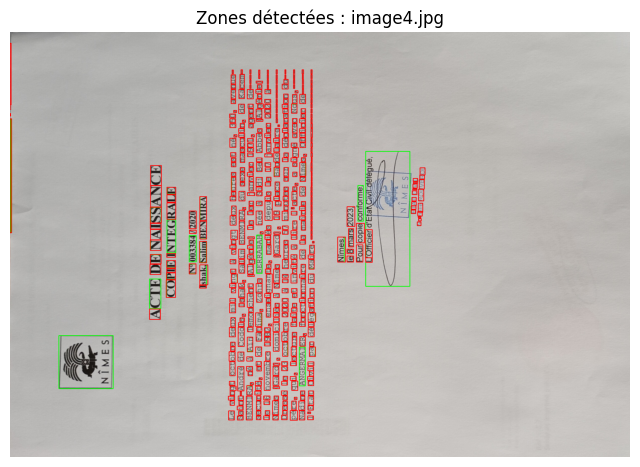

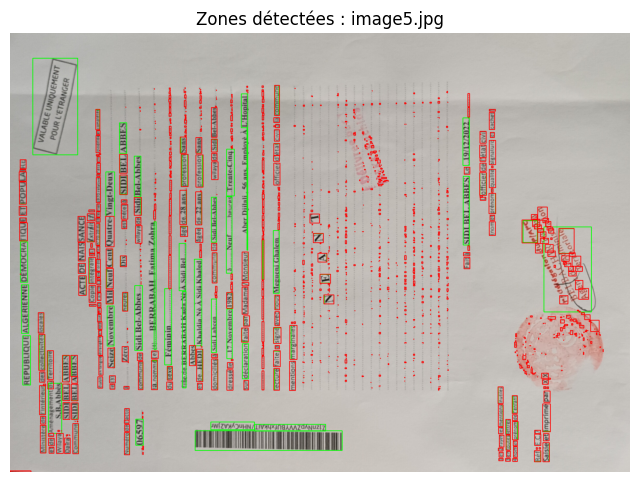

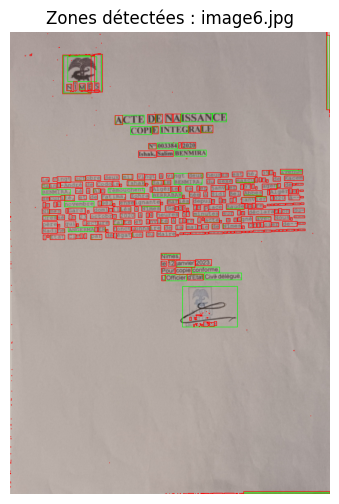

In [21]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Chemin vers le dossier contenant les documents administratifs
dossier_documents = r"C:\Users\berra\Desktop\Stage\Data"

# Liste des fichiers dans le dossier
fichiers = os.listdir(dossier_documents)

# Paramètres pour la détection des contours
seuil_bas = 20
seuil_haut = 150

# Paramètres pour l'analyse des régions
aire_minimale_contour = 500  # Aire minimale pour considérer un contour
aire_minimale_signature = 2000  # Aire minimale pour considérer une signature

# Boucle à travers les fichiers
for fichier in fichiers:
    # Charger l'image
    chemin_image = os.path.join(dossier_documents, fichier)
    image = cv2.imread(chemin_image)

    # Convertir l'image en niveaux de gris
    image_grise = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Appliquer un filtre de Sobel pour détecter les gradients
    gradient_x = cv2.Sobel(image_grise, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image_grise, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
    gradient_magnitude = np.uint8(255 * gradient_magnitude / np.max(gradient_magnitude))

    # Seuillage adaptatif pour binariser l'image des gradients
    _, image_binarisee = cv2.threshold(gradient_magnitude, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Appliquer une transformation morphologique pour supprimer le bruit
    element_structurant = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    image_morpho = cv2.morphologyEx(image_binarisee, cv2.MORPH_CLOSE, element_structurant)

    # Trouver les contours dans l'image
    contours, _ = cv2.findContours(image_morpho, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Analyser les contours pour détecter les cachets, les signatures et les parties de texte
    for contour in contours:
        aire = cv2.contourArea(contour)
        if aire > aire_minimale_contour:
            # Approximer le contour pour obtenir une forme plus simple
            epsilon = 0.02 * cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, epsilon, True)
            x, y, w, h = cv2.boundingRect(approx)

            # Filtrer les contours en fonction de leur taille
            if aire > aire_minimale_signature:
                # Dessiner un rectangle autour de la signature détectée (en vert)
                cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
            else:
                # Dessiner un rectangle autour du cachet détecté (en vert)
                cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
                
    # Dessiner un contour autour des parties de texte détectées (en rouge)
    for contour in contours:
        aire = cv2.contourArea(contour)
        if aire < aire_minimale_signature:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), 2)

    # Afficher l'image avec les zones détectées
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Zones détectées : " + fichier)
    plt.axis('off')
    plt.show()

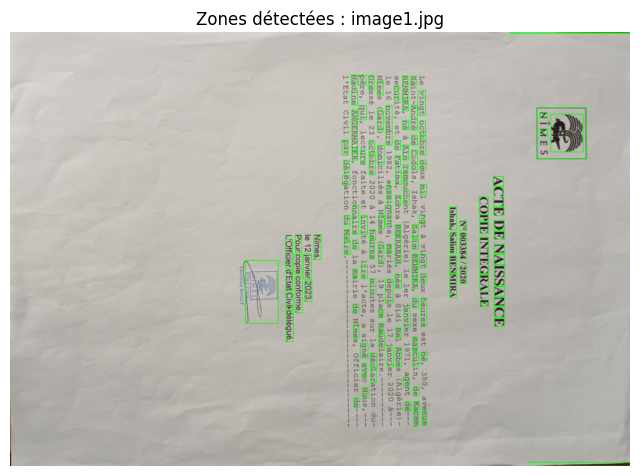

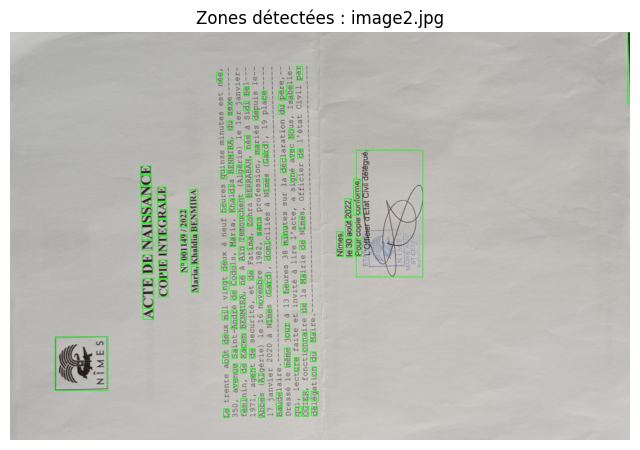

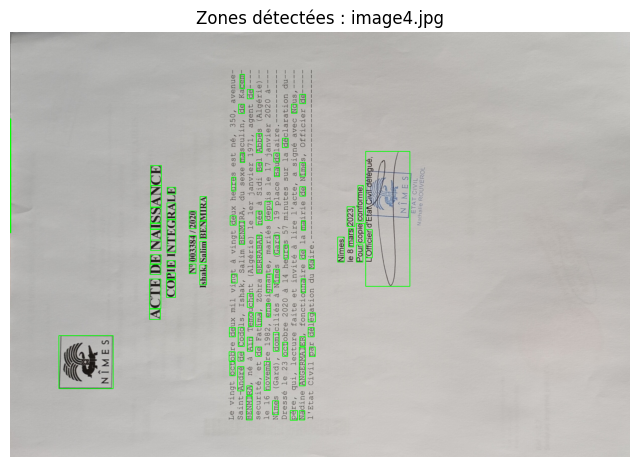

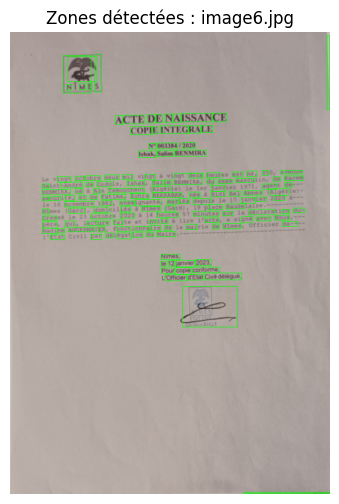

In [24]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Fonction pour extraire les caractéristiques d'une zone
def extract_features(zone):
    # Exemple d'extraction de caractéristiques (à remplacer par votre propre méthode)
    # Ici, nous utilisons les histogrammes de couleurs pour représenter les caractéristiques
    hist = cv2.calcHist([zone], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

# Chemin vers le dossier contenant les documents administratifs
dossier_documents = r"C:\Users\berra\Desktop\Stage\Data"

# Liste des fichiers dans le dossier
fichiers = os.listdir(dossier_documents)

# Paramètres pour la détection des contours
seuil_bas = 20
seuil_haut = 150

# Paramètres pour l'analyse des régions
aire_minimale_contour = 500  # Aire minimale pour considérer un contour
aire_minimale_signature = 2000  # Aire minimale pour considérer une signature

# Boucle à travers les fichiers
for fichier in fichiers:
    # Charger l'image
    chemin_image = os.path.join(dossier_documents, fichier)
    image = cv2.imread(chemin_image)

    # Convertir l'image en niveaux de gris
    image_grise = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Appliquer un filtre de Sobel pour détecter les gradients
    gradient_x = cv2.Sobel(image_grise, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image_grise, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
    gradient_magnitude = np.uint8(255 * gradient_magnitude / np.max(gradient_magnitude))

    # Seuillage adaptatif pour binariser l'image des gradients
    _, image_binarisee = cv2.threshold(gradient_magnitude, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Appliquer une transformation morphologique pour supprimer le bruit
    element_structurant = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    image_morpho = cv2.morphologyEx(image_binarisee, cv2.MORPH_CLOSE, element_structurant)

    # Trouver les contours dans l'image
    contours, _ = cv2.findContours(image_morpho, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Analyser les contours pour détecter les cachets et les signatures
    for contour in contours:
        aire = cv2.contourArea(contour)
        if aire > aire_minimale_contour:
            # Approximer le contour pour obtenir une forme plus simple
            epsilon = 0.02 * cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, epsilon, True)
            x, y, w, h = cv2.boundingRect(approx)

            # Filtrer les contours en fonction de leur taille et de leur forme
            if aire > aire_minimale_signature:
                # Dessiner un rectangle autour de la signature détectée (en vert)
                cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
                # Extraire la zone de la signature
                zone_signature = image[y:y+h, x:x+w]
                # Extraire les caractéristiques de la signature
                caracteristiques_signature = extract_features(zone_signature)
                # Faire quelque chose avec les caractéristiques de la signature...
            else:
                # Dessiner un rectangle autour du cachet détecté (en vert)
                cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
                # Extraire la zone du cachet
                zone_cachet = image[y:y+h, x:x+w]
                # Extraire les caractéristiques du cachet
                caracteristiques_cachet = extract_features(zone_cachet)
                # Faire quelque chose avec les caractéristiques du cachet...

    # Afficher l'image avec les zones détectées
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Zones détectées : " + fichier)
    plt.axis('off')
    plt.show()

In [31]:
import cv2
import numpy as np

def extract_features(image):
    # Convertir l'image en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Appliquer un détecteur de points d'intérêt (par exemple, SIFT)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    
    return descriptors

# Chemin vers l'image du cachet
chemin_cachet = r"C:\Users\berra\Desktop\Stage\cachets\image1.jpg"
# Chemin vers l'image de la signature
chemin_signature = r"C:\Users\berra\Desktop\Stage\cachets\image1.jpg"

# Charger les images
cachet = cv2.imread(chemin_cachet)
signature = cv2.imread(chemin_signature)

# Extraire les caractéristiques des cachets et des signatures
caracteristiques_cachet = extract_features(cachet)
caracteristiques_signature = extract_features(signature)

# Afficher le nombre de caractéristiques extraites
print("Nombre de caractéristiques du cachet:", caracteristiques_cachet.shape[0])
print("Nombre de caractéristiques de la signature:", caracteristiques_signature.shape[0])

Nombre de caractéristiques du cachet: 1010
Nombre de caractéristiques de la signature: 1010


In [32]:
import cv2
import numpy as np

def extract_features(image):
    # Convertir l'image en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Appliquer un détecteur de points d'intérêt (par exemple, SIFT)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    
    return descriptors

# Charger l'image contenant le cachet et la signature
chemin_image = r"C:\Users\berra\Desktop\Stage\cachets\image1.jpg"
image = cv2.imread(chemin_image)

# Définir les coordonnées de la région du cachet et de la signature
x_cachet, y_cachet, w_cachet, h_cachet = 100, 100, 200, 200  # Exemple de coordonnées du cachet
x_signature, y_signature, w_signature, h_signature = 300, 100, 200, 200  # Exemple de coordonnées de la signature

# Extraire la région du cachet et de la signature
cachet = image[y_cachet:y_cachet+h_cachet, x_cachet:x_cachet+w_cachet]
signature = image[y_signature:y_signature+h_signature, x_signature:x_signature+w_signature]

# Extraire les caractéristiques des cachets et des signatures
caracteristiques_cachet = extract_features(cachet)
caracteristiques_signature = extract_features(signature)

# Afficher le nombre de caractéristiques extraites
print("Nombre de caractéristiques du cachet:", caracteristiques_cachet.shape[0])
print("Nombre de caractéristiques de la signature:", caracteristiques_signature.shape[0])

Nombre de caractéristiques du cachet: 356
Nombre de caractéristiques de la signature: 122


In [33]:
import cv2
import numpy as np

def extract_features(image):
    # Convertir l'image en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Appliquer un détecteur de points d'intérêt (par exemple, SIFT)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    
    return descriptors

# Charger l'image contenant le cachet et la signature
chemin_image = r"C:\Users\berra\Desktop\Stage\cachets\image2.jpg"
image = cv2.imread(chemin_image)

# Définir les coordonnées de la région du cachet et de la signature
x_cachet, y_cachet, w_cachet, h_cachet = 100, 100, 200, 200  # Exemple de coordonnées du cachet
x_signature, y_signature, w_signature, h_signature = 300, 100, 200, 200  # Exemple de coordonnées de la signature

# Extraire la région du cachet et de la signature
cachet = image[y_cachet:y_cachet+h_cachet, x_cachet:x_cachet+w_cachet]
signature = image[y_signature:y_signature+h_signature, x_signature:x_signature+w_signature]

# Extraire les caractéristiques des cachets et des signatures
caracteristiques_cachet = extract_features(cachet)
caracteristiques_signature = extract_features(signature)

# Afficher le nombre de caractéristiques extraites
print("Nombre de caractéristiques du cachet:", caracteristiques_cachet.shape[0])
print("Nombre de caractéristiques de la signature:", caracteristiques_signature.shape[0])

Nombre de caractéristiques du cachet: 458
Nombre de caractéristiques de la signature: 180


In [44]:
import cv2
import numpy as np

def extract_features(image):
    # Convertir l'image en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Appliquer un détecteur de points d'intérêt (par exemple, SIFT)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    
    return descriptors

# Charger l'image contenant le cachet et la signature
chemin_image = r"C:\Users\berra\Desktop\Stage\cachets_suspects\image3.jpg"
image = cv2.imread(chemin_image)

# Définir les coordonnées de la région du cachet et de la signature
x_cachet, y_cachet, w_cachet, h_cachet = 100, 100, 200, 200  # Exemple de coordonnées du cachet
x_signature, y_signature, w_signature, h_signature = 300, 100, 200, 200  # Exemple de coordonnées de la signature

# Extraire la région du cachet et de la signature
cachet = image[y_cachet:y_cachet+h_cachet, x_cachet:x_cachet+w_cachet]
signature = image[y_signature:y_signature+h_signature, x_signature:x_signature+w_signature]

# Extraire les caractéristiques des cachets et des signatures
caracteristiques_cachet = extract_features(cachet)
caracteristiques_signature = extract_features(signature)

# Afficher le nombre de caractéristiques extraites
print("Nombre de caractéristiques du cachet:", caracteristiques_cachet.shape[0])
print("Nombre de caractéristiques de la signature:", caracteristiques_signature.shape[0])

Nombre de caractéristiques du cachet: 458
Nombre de caractéristiques de la signature: 180


In [45]:
import cv2
import numpy as np

def extract_features(image):
    # Convertir l'image en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Appliquer un détecteur de points d'intérêt (par exemple, SIFT)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    
    return descriptors

# Charger l'image contenant le cachet et la signature
chemin_image = r"C:\Users\berra\Desktop\Stage\cachets_suspects\image4.jpg"
image = cv2.imread(chemin_image)

# Définir les coordonnées de la région du cachet et de la signature
x_cachet, y_cachet, w_cachet, h_cachet = 100, 100, 200, 200  # Exemple de coordonnées du cachet
x_signature, y_signature, w_signature, h_signature = 300, 100, 200, 200  # Exemple de coordonnées de la signature

# Extraire la région du cachet et de la signature
cachet = image[y_cachet:y_cachet+h_cachet, x_cachet:x_cachet+w_cachet]
signature = image[y_signature:y_signature+h_signature, x_signature:x_signature+w_signature]

# Extraire les caractéristiques des cachets et des signatures
caracteristiques_cachet = extract_features(cachet)
caracteristiques_signature = extract_features(signature)

# Afficher le nombre de caractéristiques extraites
print("Nombre de caractéristiques du cachet:", caracteristiques_cachet.shape[0])
print("Nombre de caractéristiques de la signature:", caracteristiques_signature.shape[0])

Nombre de caractéristiques du cachet: 242
Nombre de caractéristiques de la signature: 554


In [46]:
import cv2
import numpy as np

def extract_features(image):
    # Convertir l'image en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Appliquer un détecteur de points d'intérêt (par exemple, SIFT)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    
    return descriptors

# Charger l'image contenant le cachet et la signature
chemin_image = r"C:\Users\berra\Desktop\Stage\cachets_suspects\image6.jpg"
image = cv2.imread(chemin_image)

# Définir les coordonnées de la région du cachet et de la signature
x_cachet, y_cachet, w_cachet, h_cachet = 100, 100, 200, 200  # Exemple de coordonnées du cachet
x_signature, y_signature, w_signature, h_signature = 300, 100, 200, 200  # Exemple de coordonnées de la signature

# Extraire la région du cachet et de la signature
cachet = image[y_cachet:y_cachet+h_cachet, x_cachet:x_cachet+w_cachet]
signature = image[y_signature:y_signature+h_signature, x_signature:x_signature+w_signature]

# Extraire les caractéristiques des cachets et des signatures
caracteristiques_cachet = extract_features(cachet)
caracteristiques_signature = extract_features(signature)

# Afficher le nombre de caractéristiques extraites
print("Nombre de caractéristiques du cachet:", caracteristiques_cachet.shape[0])
print("Nombre de caractéristiques de la signature:", caracteristiques_signature.shape[0])

Nombre de caractéristiques du cachet: 137
Nombre de caractéristiques de la signature: 57


In [49]:
import cv2
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def extract_features(image):
    # Convertir l'image en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Appliquer un détecteur de points d'intérêt (par exemple, SIFT)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    
    return descriptors

def compare_images(image_paths):
    # Charger les images et extraire les caractéristiques des cachets et des signatures
    caract_cachets = []
    caract_signatures = []
    
    for path in image_paths:
        image = cv2.imread(path)
        cachet = extract_features(image[y_cachet:y_cachet+h_cachet, x_cachet:x_cachet+w_cachet])
        signature = extract_features(image[y_signature:y_signature+h_signature, x_signature:x_signature+w_signature])
        
        caract_cachets.append(cachet)
        caract_signatures.append(signature)
    
    # Comparer les caractéristiques des cachets
    for i in range(len(caract_cachets)):
        for j in range(i+1, len(caract_cachets)):
            sim_cachet = cosine_similarity(caract_cachets[i], caract_cachets[j])[0][0]
            if sim_cachet > seuil_similarite:
                print(f"Les cachets des images {i+1} et {j+1} sont similaires.")
    
    # Comparer les caractéristiques des signatures
    for i in range(len(caract_signatures)):
        for j in range(i+1, len(caract_signatures)):
            sim_signature = cosine_similarity(caract_signatures[i], caract_signatures[j])[0][0]
            if sim_signature > seuil_similarite:
                print(f"Les signatures des images {i+1} et {j+1} sont similaires.")

# Liste des chemins d'accès de vos images
chemins_images = [
    r"C:\Users\berra\Desktop\Stage\cachets\image1.jpg",
    r"C:\Users\berra\Desktop\Stage\cachets\image2.jpg",
    r"C:\Users\berra\Desktop\Stage\cachets_suspects\image3.jpg",
    r"C:\Users\berra\Desktop\Stage\cachets_suspects\image4.jpg",
    r"C:\Users\berra\Desktop\Stage\cachets_suspects\image5.jpg"
]

# Coordonnées des régions du cachet et de la signature
x_cachet, y_cachet, w_cachet, h_cachet = 100, 100, 200, 200  # Exemple de coordonnées du cachet
x_signature, y_signature, w_signature, h_signature = 300, 100, 200, 200  # Exemple de coordonnées de la signature

# Seuil de similarité
seuil_similarite = 0.9  # Par exemple

# Comparaison des images
compare_images(chemins_images)

Les cachets des images 2 et 3 sont similaires.
Les signatures des images 2 et 3 sont similaires.


In [57]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, confusion_matrix

# Fonction pour extraire les caractéristiques des images avec descripteurs SIFT
def extract_features(image_path):
    # Lire l'image en niveaux de gris
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Initialiser le détecteur SIFT
    sift = cv2.SIFT_create()
    
    # Détecter les points d'intérêt et calculer les descripteurs
    keypoints, descriptors = sift.detectAndCompute(image, None)
    
    return descriptors

# Chemins vers les dossiers contenant les images authentiques et suspectes
authentic_folder = r"C:\Users\berra\Desktop\Stage\cachets"
suspect_folder = r"C:\Users\berra\Desktop\Stage\cachets_suspects"

# Charger les images des cachets authentiques
for fichier in os.listdir(dossier_cachets):
    chemin_image = os.path.join(dossier_cachets, fichier)
    image = cv2.imread(chemin_image)
    caracteristiques = extraire_caracteristiques(image)
    caracteristiques_cachets_authentiques.append(caracteristiques)

# Liste des caractéristiques des cachets suspects
caracteristiques_cachets_suspects = []

# Charger les images des cachets suspects
for fichier in os.listdir(dossier_cachets_suspects)[:2]:  # Prendre seulement les deux premières images
    chemin_image = os.path.join(dossier_cachets_suspects, fichier)
    image = cv2.imread(chemin_image)
    caracteristiques = extraire_caracteristiques(image)
    caracteristiques_cachets_suspects.append(caracteristiques)

# Fusion des données authentiques et suspectes
if len(authentic_features) > 0:
    X_authentic = np.vstack(authentic_features)
    y_authentic = np.zeros(len(authentic_features), dtype=int)
else:
    X_authentic = np.empty((0, 128))  # Le descripteur SIFT a une longueur de 128
    y_authentic = np.empty(0, dtype=int)

if len(suspect_features) > 0:
    X_suspect = np.vstack(suspect_features)
    y_suspect = np.ones(len(suspect_features), dtype=int)
else:
    X_suspect = np.empty((0, 128))  # Le descripteur SIFT a une longueur de 128
    y_suspect = np.empty(0, dtype=int)

X = np.vstack((X_authentic, X_suspect))
y = np.hstack((y_authentic, y_suspect))

# Entraînement du modèle de classification (par exemple, KMeans)
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)

# Prédiction sur l'ensemble des données
predictions = kmeans.labels_

# Évaluation du modèle
accuracy = silhouette_score(X, predictions)
print("Silhouette Score:", accuracy)

print("Predicted Labels:")
print(predictions)

Silhouette Score: 0.11026358
Predicted Labels:
[1 1 1 ... 1 0 1]


In [69]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans

def extract_features(image):
    # Convertir l'image en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Initialiser le détecteur SIFT
    sift = cv2.SIFT_create()
    
    # Détecter les points d'intérêt et calculer les descripteurs
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    
    return descriptors

def redimensionner_caracteristiques(caracteristiques, longueur_cible):
    # S'assurer que le nombre de caractéristiques est égal à longueur_cible
    if caracteristiques.shape[0] < longueur_cible:
        # Si le nombre de caractéristiques est inférieur à longueur_cible, ajouter des zéros à la fin
        caracteristiques = np.vstack([caracteristiques, np.zeros((longueur_cible - caracteristiques.shape[0], caracteristiques.shape[1]))])
    elif caracteristiques.shape[0] > longueur_cible:
        # Si le nombre de caractéristiques est supérieur à longueur_cible, sélectionner les premières longueur_cible caractéristiques
        caracteristiques = caracteristiques[:longueur_cible, :]
    return caracteristiques

# Définir une longueur cible pour les caractéristiques
longueur_cible = 500  # Par exemple, choisissez une valeur appropriée pour votre application

# Liste des caractéristiques des cachets suspects
caracteristiques_cachets_suspects = []

# Charger les images des cachets suspects
dossier_cachets_suspects = "C:\\Users\\berra\\Desktop\\Stage\\cachets_suspects"
for fichier in os.listdir(dossier_cachets_suspects):
    chemin_image = os.path.join(dossier_cachets_suspects, fichier)
    image = cv2.imread(chemin_image)
    caracteristiques = extract_features(image)
    # Redimensionner les caractéristiques pour avoir la même longueur
    caracteristiques = redimensionner_caracteristiques(caracteristiques, longueur_cible)
    caracteristiques_cachets_suspects.append(caracteristiques.flatten())  # Aplatir les caractéristiques

# Convertir la liste en tableau numpy
caracteristiques_cachets_suspects = np.array(caracteristiques_cachets_suspects)

# Initialiser et ajuster le modèle KMeans
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(caracteristiques_cachets_suspects)

# Prédire les clusters pour les cachets suspects
etiquettes_clusters = kmeans.predict(caracteristiques_cachets_suspects)

# Afficher les résultats
for i, fichier in enumerate(os.listdir(dossier_cachets_suspects)):
    chemin_image = os.path.join(dossier_cachets_suspects, fichier)
    if etiquettes_clusters[i] == 0:
        print(f"Le cachet dans {fichier} est authentique.")
    else:
        print(f"Le cachet dans {fichier} est suspect.")

Le cachet dans image3.jpg est authentique.
Le cachet dans image4.jpg est authentique.
Le cachet dans image5.jpg est suspect.


In [4]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans

def extract_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return descriptors

def redimensionner_caracteristiques(caracteristiques, longueur_cible):
    if caracteristiques.shape[0] < longueur_cible:
        caracteristiques = np.concatenate([caracteristiques, np.zeros((longueur_cible - caracteristiques.shape[0], 128))])
    elif caracteristiques.shape[0] > longueur_cible:
        caracteristiques = caracteristiques[:longueur_cible]
    return caracteristiques

# Définir une longueur cible pour les caractéristiques
longueur_cible = 500

# Initialiser le modèle KMeans
kmeans = KMeans(n_clusters=2)

# Liste des caractéristiques des cachets suspects
caracteristiques_cachets_suspects = []

# Liste des caractéristiques des signatures suspects
caracteristiques_signatures_suspects = []

# Charger les images des cachets et des signatures suspects
dossier_cachets_suspects = "C:\\Users\\berra\\Desktop\\Stage\\images_extraits_suspects"
dossier_signatures_suspects = "C:\\Users\\berra\\Desktop\\Stage\\images_extraits_suspects"

for fichier in os.listdir(dossier_cachets_suspects):
    chemin_image = os.path.join(dossier_cachets_suspects, fichier)
    image = cv2.imread(chemin_image)
    caracteristiques = extract_features(image)
    caracteristiques = redimensionner_caracteristiques(caracteristiques, longueur_cible)
    caracteristiques_cachets_suspects.append(caracteristiques.flatten())  

for fichier in os.listdir(dossier_signatures_suspects):
    chemin_image = os.path.join(dossier_signatures_suspects, fichier)
    image = cv2.imread(chemin_image)
    caracteristiques = extract_features(image)
    caracteristiques = redimensionner_caracteristiques(caracteristiques, longueur_cible)
    caracteristiques_signatures_suspects.append(caracteristiques.flatten())  

# Convertir les listes en tableaux numpy
caracteristiques_cachets_suspects = np.array(caracteristiques_cachets_suspects)
caracteristiques_signatures_suspects = np.array(caracteristiques_signatures_suspects)

# Combinez les caractéristiques de cachets et de signatures en un seul tableau pour chaque catégorie
caracteristiques_combines_cachets_signatures = np.concatenate((caracteristiques_cachets_suspects, caracteristiques_signatures_suspects), axis=0)

# Entraîner le modèle KMeans sur l'ensemble combiné de caractéristiques
kmeans.fit(caracteristiques_combines_cachets_signatures)

# Prédire les clusters pour les cachets et les signatures
etiquettes_clusters_cachets = kmeans.predict(caracteristiques_cachets_suspects)
etiquettes_clusters_signatures = kmeans.predict(caracteristiques_signatures_suspects)

# Afficher les résultats pour les cachets
print("Résultats pour les cachets :")
for i, fichier in enumerate(os.listdir(dossier_cachets_suspects)):
    chemin_image = os.path.join(dossier_cachets_suspects, fichier)
    if etiquettes_clusters_cachets[i] == 0:
        print(f"Le cachet dans {fichier} est authentique.")
    else:
        print(f"Le cachet dans {fichier} est suspect.")

# Afficher les résultats pour les signatures
print("\nRésultats pour les signatures :")
for i, fichier in enumerate(os.listdir(dossier_signatures_suspects)):
    chemin_image = os.path.join(dossier_signatures_suspects, fichier)
    if etiquettes_clusters_signatures[i] == 0:
        print(f"La signature dans {fichier} est authentique.")
    else:
        print(f"La signature dans {fichier} est suspecte.")

Résultats pour les cachets :
Le cachet dans birth_act (1)_1.jpg est authentique.
Le cachet dans birth_act (2)_1.jpg est authentique.
Le cachet dans birth_act (2)_11.jpg est authentique.
Le cachet dans birth_act (3)_1.jpg est suspect.
Le cachet dans birth_act (4)_1.jpg est suspect.
Le cachet dans birth_act (5)_1.jpg est suspect.
Le cachet dans birth_act (5)_11.jpg est suspect.
Le cachet dans birth_act (6)_1.jpg est suspect.
Le cachet dans birth_act (7)_1.jpg est authentique.
Le cachet dans birth_act (8)_1.jpg est suspect.
Le cachet dans birth_act (9)_1.jpg est suspect.
Le cachet dans birth_act (9)_11.jpg est suspect.

Résultats pour les signatures :
La signature dans birth_act (1)_1.jpg est authentique.
La signature dans birth_act (2)_1.jpg est authentique.
La signature dans birth_act (2)_11.jpg est authentique.
La signature dans birth_act (3)_1.jpg est suspecte.
La signature dans birth_act (4)_1.jpg est suspecte.
La signature dans birth_act (5)_1.jpg est suspecte.
La signature dans bir